<a href="https://colab.research.google.com/github/kikopapa/PCB_Defect_Detection/blob/main/final_project_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import locale
locale.getpreferredencoding = lambda: 'UTF-8'

In [ ]:
!pip install ultralytics  #安裝YOLOv8

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 15.0 MB/s eta 0:00:00


In [ ]:
# check gpu
!nvidia-smi

Wed Oct 16 01:37:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import ultralytics
ultralytics.checks()

from ultralytics import YOLO
from IPython.display import display, Image

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.2/107.7 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/my_project/DsPCBSD+.zip /content
!unzip /content/DsPCBSD+.zip -d /content/

串流輸出內容已截斷至最後 5000 行。
  inflating: /content/Data_YOLO/labels/train/S_11850030.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850282.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850293.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850308.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850435.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850462.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850671.txt  
  inflating: /content/Data_YOLO/labels/train/S_11850978.txt  
  inflating: /content/Data_YOLO/labels/train/S_11851325.txt  
  inflating: /content/Data_YOLO/labels/train/S_11852266.txt  
  inflating: /content/Data_YOLO/labels/train/S_11852575.txt  
  inflating: /content/Data_YOLO/labels/train/S_11852653.txt  
  inflating: /content/Data_YOLO/labels/train/S_11853085.txt  
  inflating: /content/Data_YOLO/labels/train/S_11853237.txt  
  inflating: /content/Data_YOLO/labels/train/S_11853336.txt  
  inflating: /content/Data_YOLO/labels/train/S_11

In [ ]:
# !ls /content/drive/MyDrive/yolo/data
!ls /content/Data_YOLO
# ├── dataset
#     ├── images
#         ├── train  # 訓練圖片
#         ├── val    # 驗證圖片
#     ├── labels
#         ├── train  # 訓練標籤（YOLO格式）
#         ├── val    # 驗證標籤（YOLO格式）


images	labels


In [ ]:
!pip install tensorboard  # 安裝TensorBoard

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=/content/runs/detect/train3

<IPython.core.display.Javascript object>

In [ ]:
# 加載圖像和標籤
# 建立 YOLO 模型架構

# GENRE_LIST = ["SH", "SP", "SC", "OP", "MB", "HB", "CS", "CFO", "BMFO"]

# 加載 YOLOv8 模型，使用預訓練權重作為起點（例如 'yolov8n.pt'，表示 YOLOv8 nano 版本）
# 也可以選擇不同大小的 YOLOv8 模型，如 YOLOv8n（nano）、YOLOv8s（small）、YOLOv8m（medium）、YOLOv8l（large）等，來平衡模型精度和計算效率
# load a pretrained model (recommended for training)
model = YOLO('/content/drive/MyDrive/my_project/pt_1008/best.pt')
# model = YOLO("yolov8s.pt")

# Train the model
results = model.train(data="/content/drive/MyDrive/my_project/pcb.yaml",
            epochs=50,  # 訓練迭代次數
            imgsz=640,  # 圖像大小
            patience=5,
            plots=True)

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/my_project/pt_1008/best.pt, data=/content/drive/MyDrive/my_project/pcb.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /content/Data_YOLO/labels/train.cache... 8208 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8208/8208 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Data_YOLO/labels/val.cache... 2051 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2051/2051 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.34G       1.32     0.9829      1.165         59        640: 100%|██████████| 513/513 [03:03<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:18<00:00,  3.48it/s]

                   all       2051       4092       0.77      0.765      0.813       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.31G      1.355      1.052      1.184         47        640: 100%|██████████| 513/513 [02:58<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:18<00:00,  3.43it/s]


                   all       2051       4092      0.758      0.749      0.789      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.31G      1.385      1.095      1.201         51        640: 100%|██████████| 513/513 [02:58<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:19<00:00,  3.35it/s]


                   all       2051       4092      0.743      0.725      0.762      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.32G      1.395      1.123      1.204         40        640: 100%|██████████| 513/513 [02:57<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:19<00:00,  3.42it/s]

                   all       2051       4092      0.764      0.713      0.774      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.32G      1.398       1.11      1.208         66        640: 100%|██████████| 513/513 [02:56<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:18<00:00,  3.44it/s]

                   all       2051       4092      0.765      0.733      0.787      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       2.3G      1.381      1.097      1.201         45        640: 100%|██████████| 513/513 [02:57<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:18<00:00,  3.49it/s]

                   all       2051       4092      0.755      0.722      0.778      0.446
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 1, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



6 epochs completed in 0.333 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.6MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,686,123 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:22<00:00,  2.94it/s]


                   all       2051       4092      0.768      0.767      0.813       0.48
                    SH        126        169      0.719      0.864      0.869       0.56
                    SP        430        929      0.834      0.699      0.816      0.371
                    SC        245        285      0.823      0.709      0.799      0.477
                    OP        274        338      0.705      0.846      0.853      0.489
                    MB        391        546      0.832      0.679      0.793      0.388
                    HB        271        608      0.929      0.936      0.981      0.826
                    CS        279        448        0.7      0.625      0.685      0.407
                   CFO        309        423      0.632      0.645      0.678      0.363
                  BMFO        305        346      0.736      0.899      0.846      0.438
Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect

In [ ]:
# 訓練完成後可以測試模型，並查看驗證結果
results = model.val()  # 驗證模型性能

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,686,123 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /content/Data_YOLO/labels/val.cache... 2051 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2051/2051 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 129/129 [00:27<00:00,  4.66it/s]


                   all       2051       4092       0.77      0.766      0.813       0.48
                    SH        126        169      0.721      0.864      0.869       0.56
                    SP        430        929      0.836      0.699      0.819      0.372
                    SC        245        285      0.832      0.715      0.801      0.478
                    OP        274        338      0.704      0.846      0.853      0.487
                    MB        391        546       0.84      0.683      0.798       0.39
                    HB        271        608      0.929      0.936      0.981      0.826
                    CS        279        448      0.701      0.622      0.684      0.407
                   CFO        309        423      0.634      0.641      0.677      0.363
                  BMFO        305        346      0.732      0.893      0.836      0.437
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect

In [ ]:
# !ls /content/runs
# !ls /content/runs/detect
# !ls /content/runs/detect/train
# !ls /content/runs/detect/train2
# !ls /content/runs/detect/train2/weights/
# !ls -l /content/runs/detect/train22
!ls -l /content/runs/detect/train3
!ls -l /content/runs/detect/train32

total 5748
-rw-r--r-- 1 root root   1616 Oct 16 03:14 args.yaml
-rw-r--r-- 1 root root 182515 Oct 16 03:35 confusion_matrix_normalized.png
-rw-r--r-- 1 root root 164857 Oct 16 03:35 confusion_matrix.png
-rw-r--r-- 1 root root 210473 Oct 16 03:36 events.out.tfevents.1729048444.4b2123d7b0e1.1086.1
-rw-r--r-- 1 root root 347325 Oct 16 03:35 F1_curve.png
-rw-r--r-- 1 root root 303681 Oct 16 03:14 labels_correlogram.jpg
-rw-r--r-- 1 root root 192073 Oct 16 03:14 labels.jpg
-rw-r--r-- 1 root root 303458 Oct 16 03:35 P_curve.png
-rw-r--r-- 1 root root 278039 Oct 16 03:35 PR_curve.png
-rw-r--r-- 1 root root 327823 Oct 16 03:35 R_curve.png
-rw-r--r-- 1 root root    940 Oct 16 03:34 results.csv
-rw-r--r-- 1 root root 302190 Oct 16 03:35 results.png
-rw-r--r-- 1 root root 327059 Oct 16 03:14 train_batch0.jpg
-rw-r--r-- 1 root root 314961 Oct 16 03:14 train_batch1.jpg
-rw-r--r-- 1 root root 345949 Oct 16 03:14 train_batch2.jpg
-rw-r--r-- 1 root root 383576 Oct 16 03:34 val_batch0_labels.jpg
-rw-r-

In [ ]:
# 保存訓練好的模型
# !cp '/content/runs/detect/train2/weights/best.pt' /content/drive/MyDrive/my_project/
# !cp '/content/runs/detect/train2/weights/last.pt' /content/drive/MyDrive/my_project/
# !cp /content/runs/detect/train2/*.jpg /content/drive/MyDrive/my_project/images_1016
# !cp /content/runs/detect/train2/*.png /content/drive/MyDrive/my_project/images_1016
!cp /content/runs/detect/train22/*.jpg /content/drive/MyDrive/my_project/images_1016_model_val
!cp /content/runs/detect/train22/*.png /content/drive/MyDrive/my_project/images_1016_model_val

In [ ]:
# print('/content/runs/detect/train2/args.yaml')
# args.yaml
# 內容：這是模型訓練過程中使用的超參數和配置文件，記錄了訓練時所使用的所有參數，例如 batch size、學習率、數據集路徑等。
# 用途：方便重現訓練過程，或者進行參數調整。
# weights/best.pt 跟 weights/last.pt
# 內容：該目錄包含訓練過程中生成的權重文件（如 best.pt 和 last.pt）。
# 用途：保存了最佳模型和最後一次訓練的模型，這些權重可以用於進行推理或進一步的調整。

/content/runs/detect/train2/args.yaml


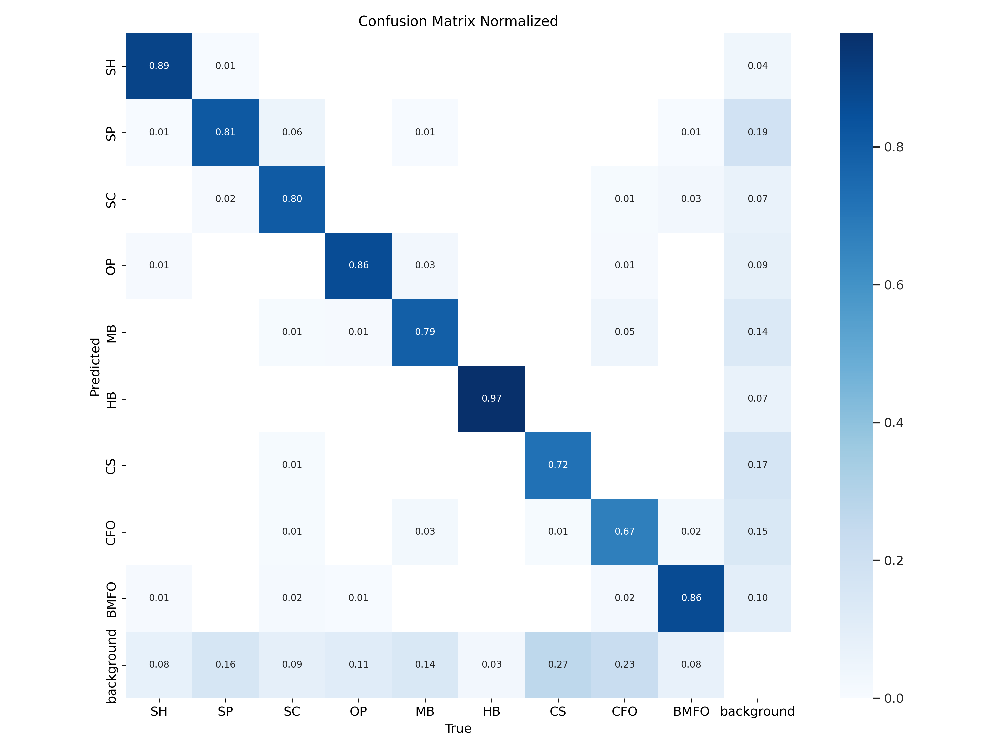

In [ ]:
# Image(filename='/content/runs/detect/train2/confusion_matrix.png', width=1000)
Image(filename='/content/runs/detect/train2/confusion_matrix_normalized.png', width=1000)

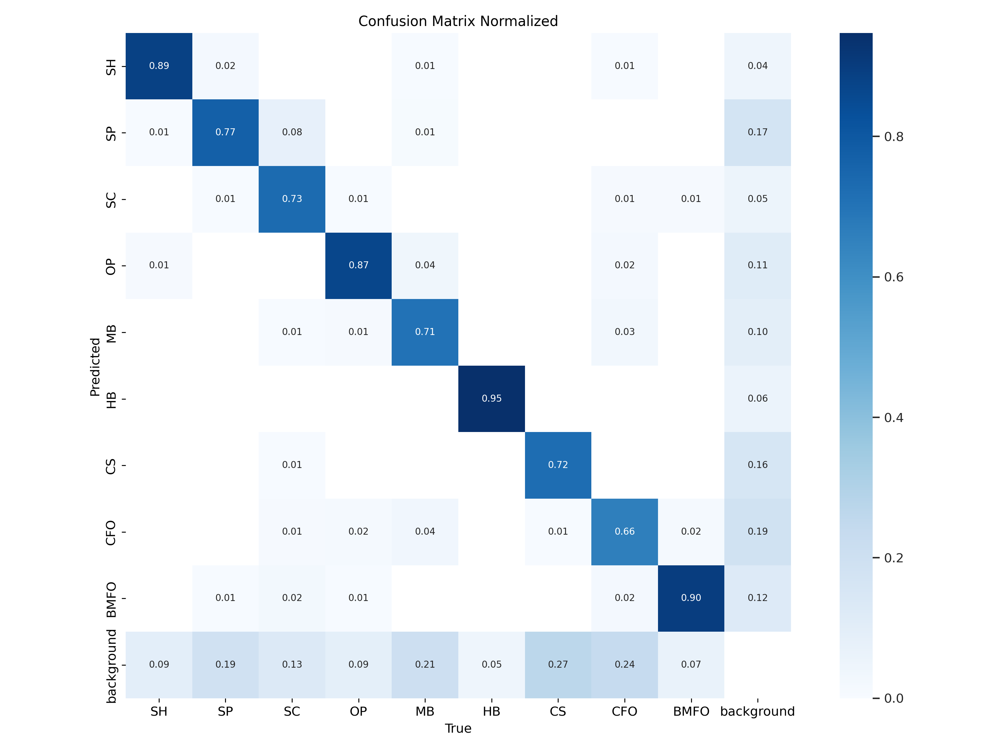

In [ ]:
#20241016
Image(filename='/content/runs/detect/train2/confusion_matrix_normalized.png', width=1000)

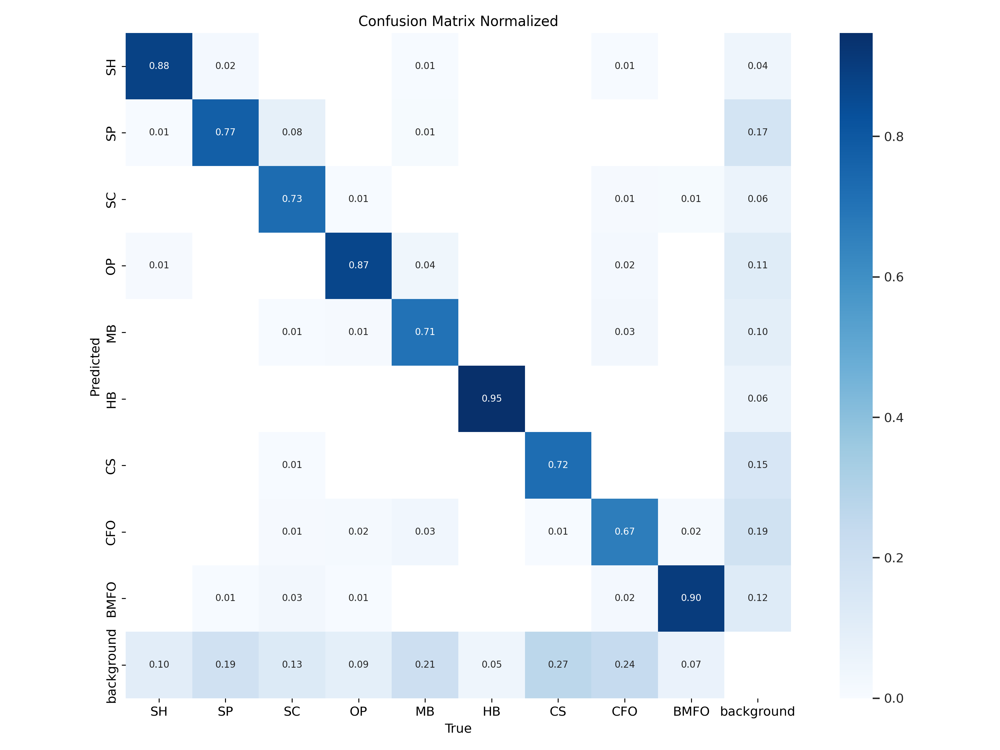

In [ ]:
#20241016
Image(filename='/content/runs/detect/train22/confusion_matrix_normalized.png', width=1000)

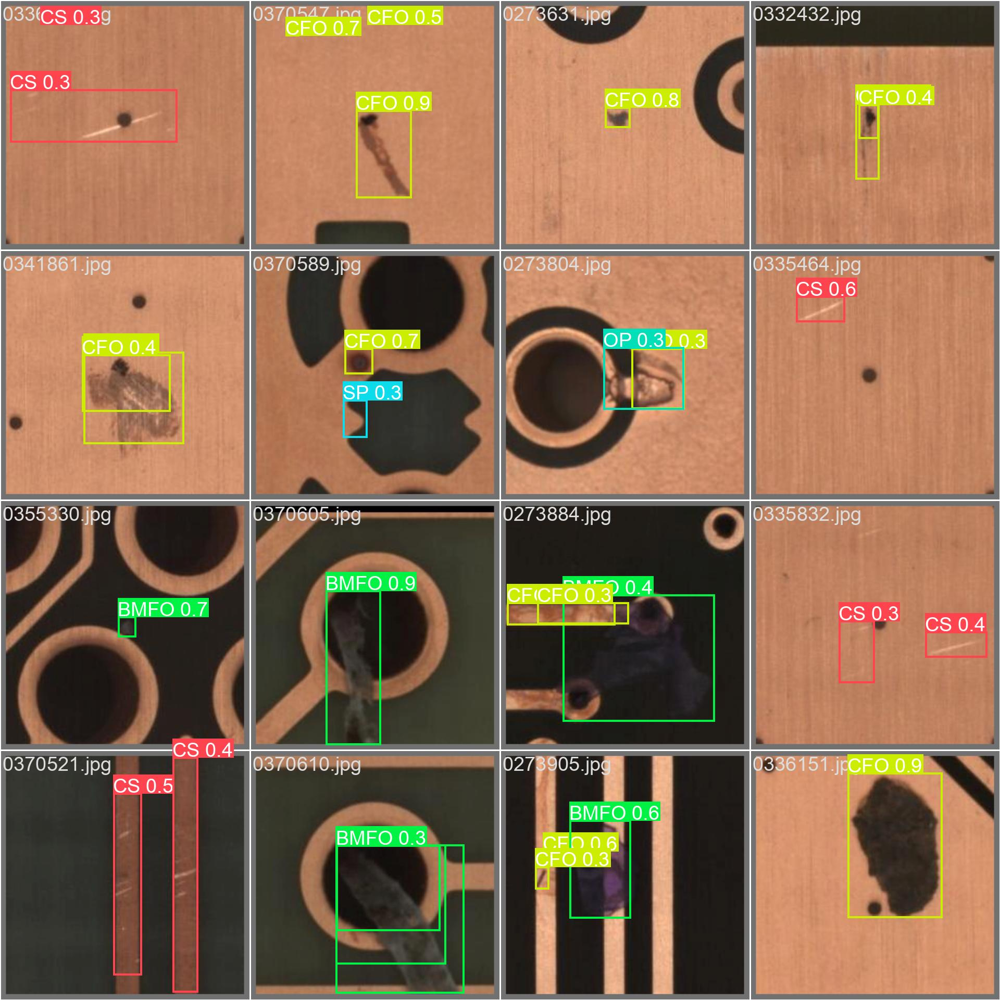

In [ ]:
Image(filename='/content/runs/detect/train2/val_batch0_labels.jpg', width=1000)
Image(filename='/content/runs/detect/train2/val_batch0_pred.jpg', width=1000)
# Image(filename='/content/runs/detect/train2/val_batch1_labels.jpg', width=1000)
# Image(filename='/content/runs/detect/train2/val_batch1_pred.jpg', width=1000)
Image(filename='/content/runs/detect/train2/val_batch2_labels.jpg', width=1000)
Image(filename='/content/runs/detect/train2/val_batch2_pred.jpg', width=1000)

# 內容：這些圖像展示了驗證數據集上的模型預測結果 (val_batchX_pred.jpg) 和真實標籤 (val_batchX_labels.jpg)，X 表示批次號。
# 用途：用來可視化驗證數據的預測效果，了解模型是否準確地識別了目標物件。

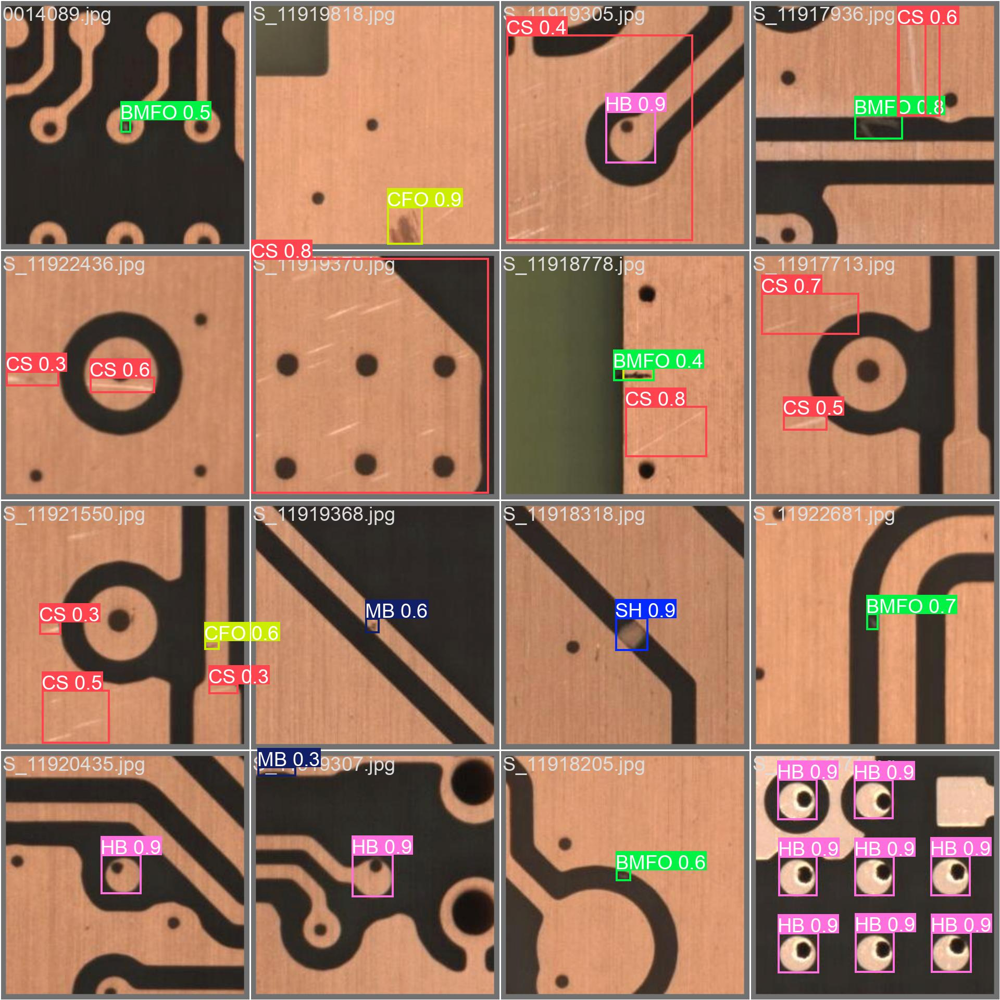

In [ ]:
#20241016
# display(Image(filename='/content/runs/detect/train22/val_batch0_labels.jpg', width=1000))
display(Image(filename='/content/runs/detect/train2/val_batch0_pred.jpg', width=1000))

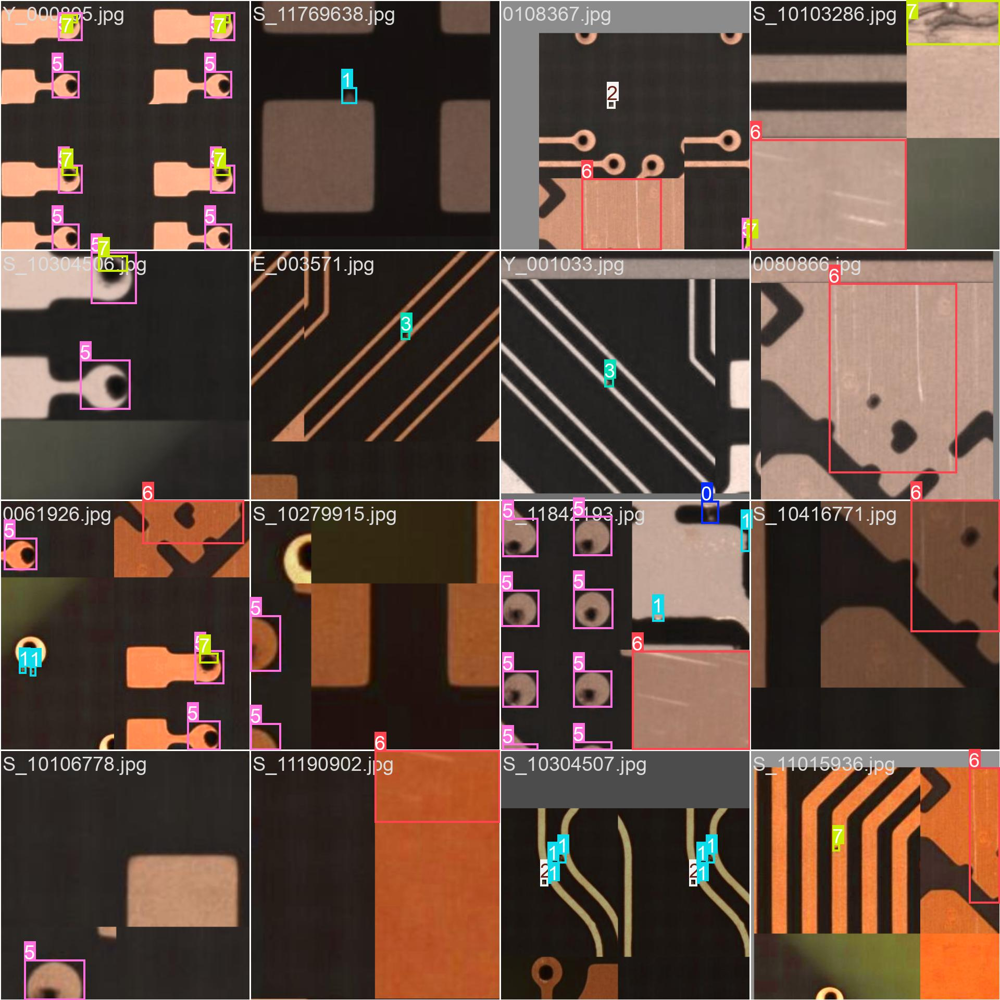

In [ ]:
Image(filename='/content/runs/detect/train2/train_batch0.jpg', width=1000)
# Image(filename='/content/runs/detect/train2/train_batch1.jpg', width=1000)
# Image(filename='/content/runs/detect/train2/train_batch2.jpg', width=1000)

# 內容：這些圖像展示了訓練批次中輸入數據和對應標籤的可視化結果，X 表示批次號。
# 用途：用來檢查數據加載過程中的標註是否正確，了解數據在進行增強處理後的狀況

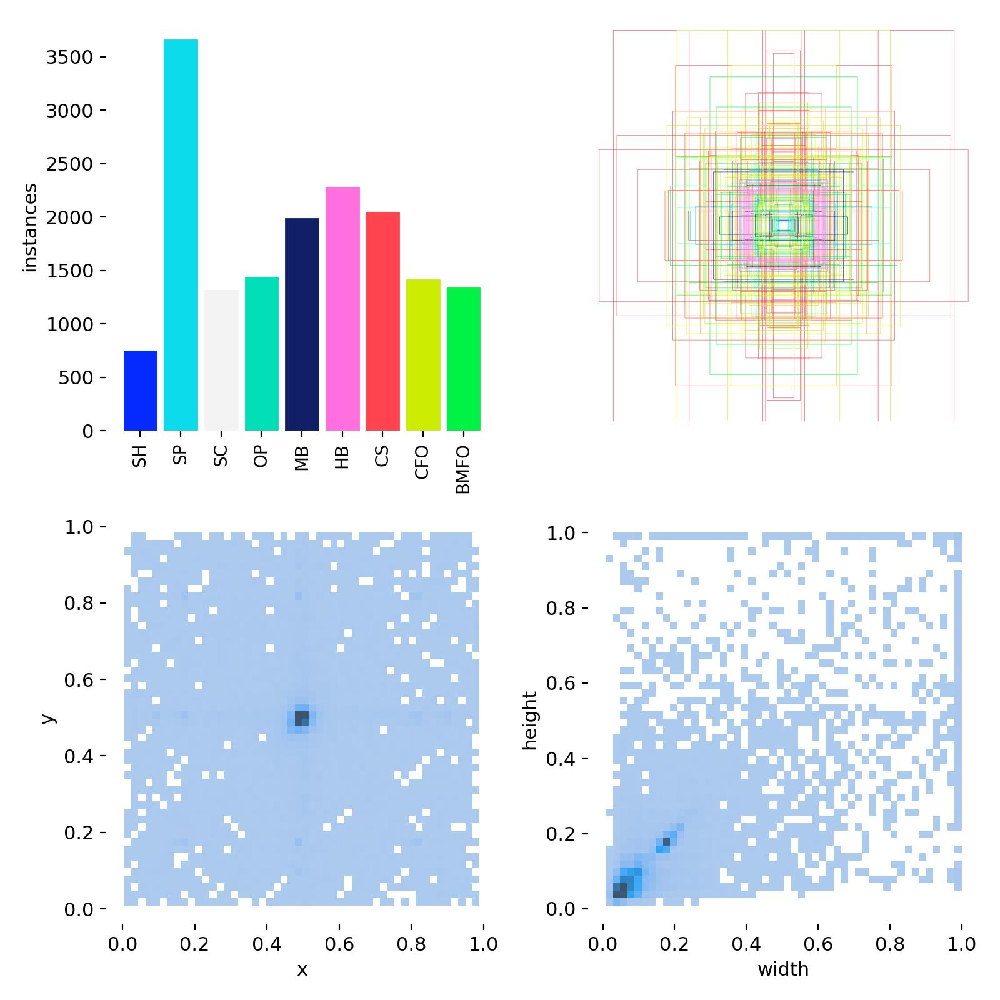

In [ ]:
Image(filename='/content/runs/detect/train2/labels_correlogram.jpg', width=600)
Image(filename='/content/runs/detect/train2/labels.jpg', width=600)
# labels.jpg
# 內容：顯示數據集中所有標籤的分佈情況。
# 用途：用來檢查數據集中各類別的數量分佈，是否存在數據不平衡問題。
# labels_correlogram.jpg
# 內容：顯示數據集中標籤之間的相關性（co-occurrence），用來檢查標籤是否經常一起出現。
# 用途：用來觀察不同類別之間的相關性，可能有助於理解數據集的結構

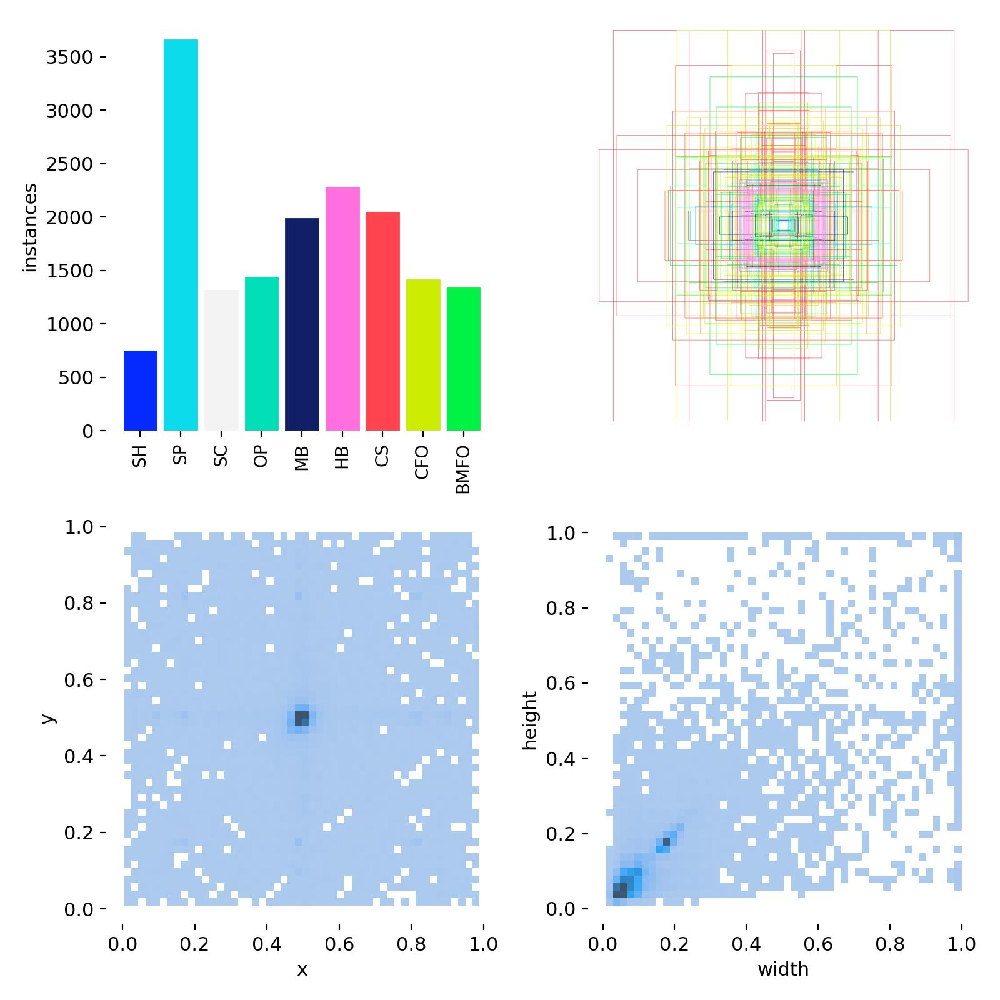

In [ ]:
#20241016
Image(filename='/content/runs/detect/train2/labels.jpg', width=600)

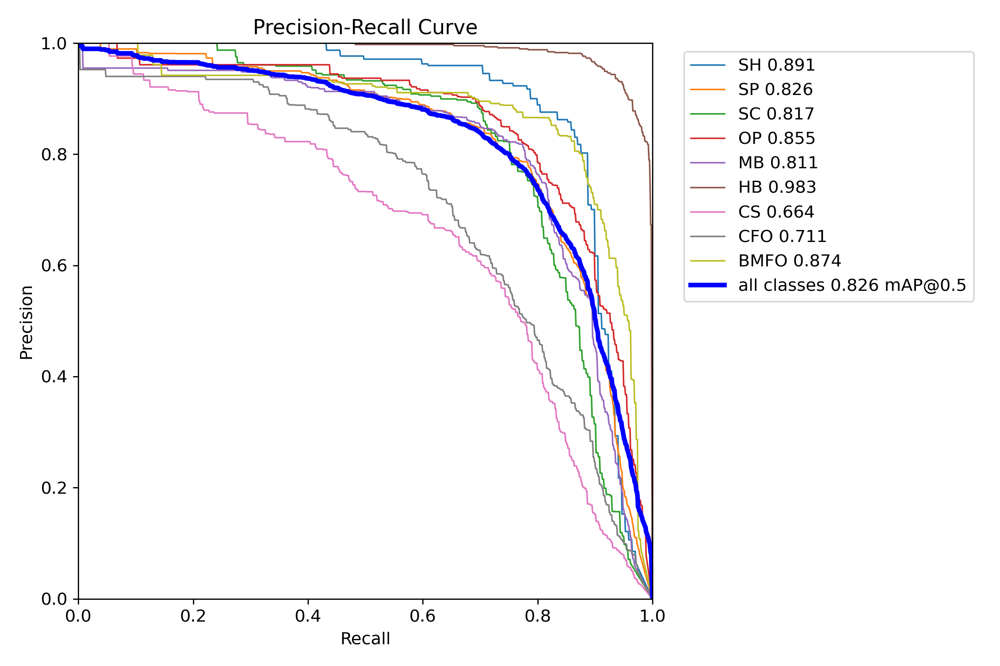

In [ ]:
Image(filename='/content/runs/detect/train2/F1_curve.png', width=600) # 顯示模型在不同信心閾值下的F1分數曲線
Image(filename='/content/runs/detect/train2/P_curve.png', width=600) # 精確度(Precision)曲線，顯示在不同信心閾值下的精確度變化
Image(filename='/content/runs/detect/train2/R_curve.png', width=600) # 召回率(Recall)曲線，顯示在不同信心閾值下的召回率變化
Image(filename='/content/runs/detect/train2/PR_curve.png', width=600) # 精確度-召回率曲線，顯示精確度與召回率之間的平衡

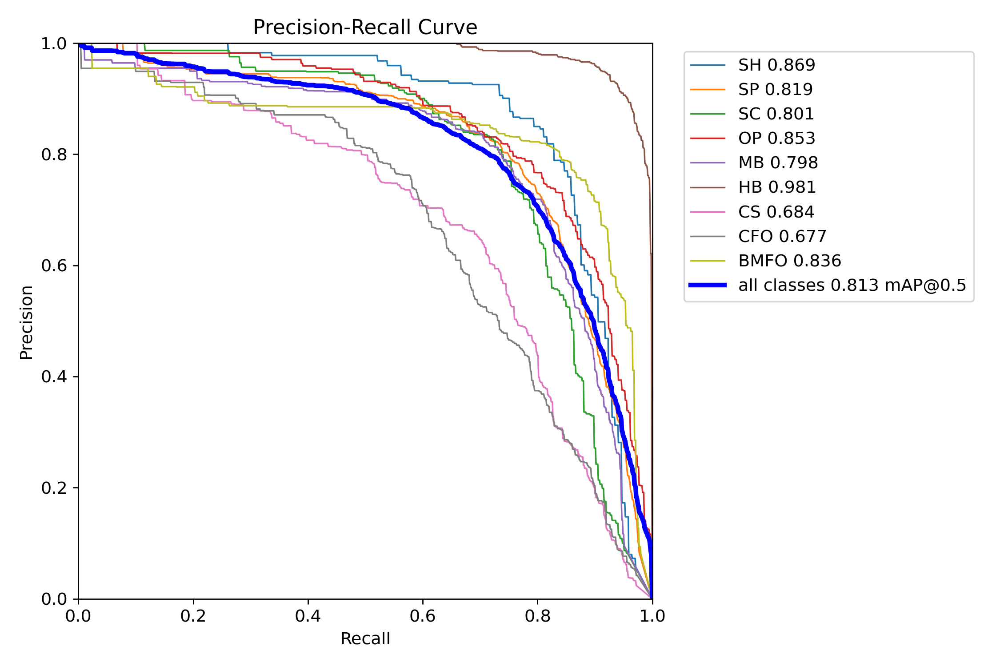

In [ ]:
#20241016
Image(filename='/content/runs/detect/train22/PR_curve.png', width=600)

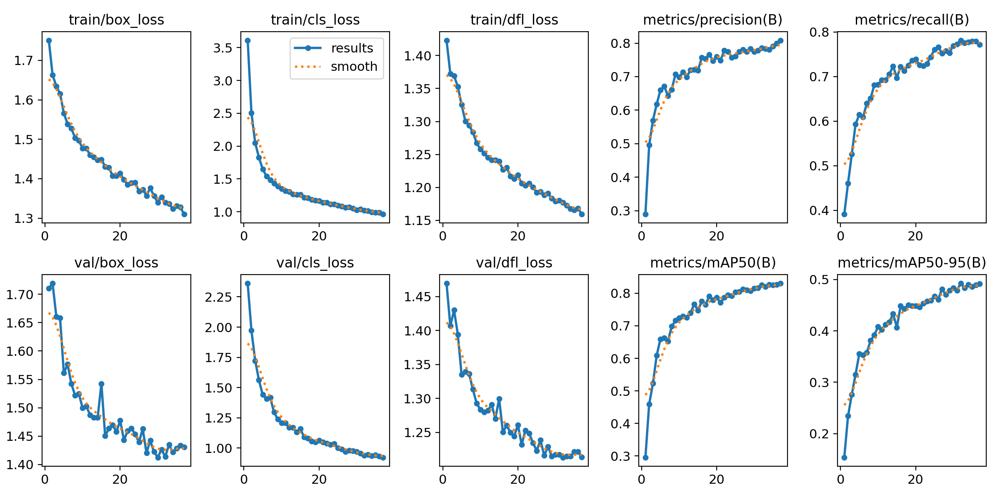

In [ ]:
Image(filename='/content/runs/detect/train2/results.png', width=1000)
# 內容：包含訓練過程中的多種評估指標，如 Precision、Recall、mAP (mean Average Precision) 在不同 epoch 的變化。
# 用途：幫助觀察訓練和驗證的性能隨著 epoch 的變化，了解模型的收斂情況

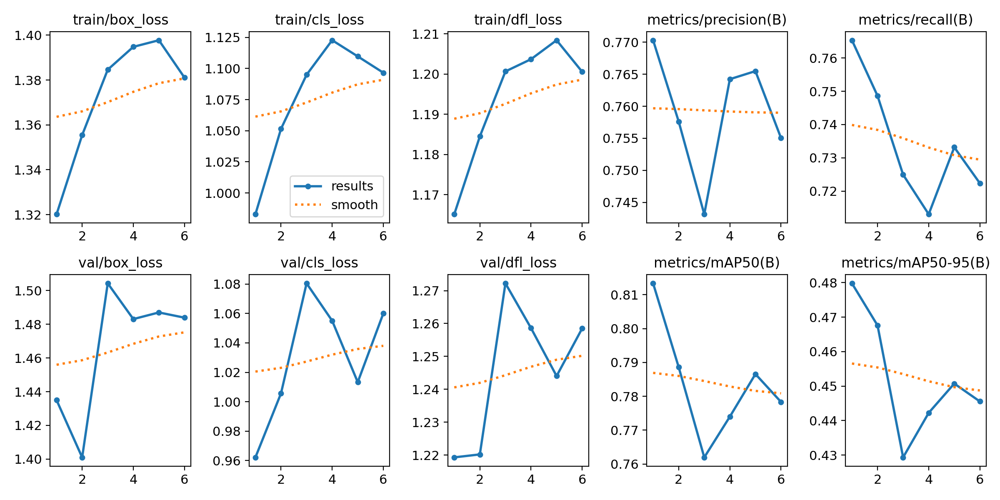

In [ ]:
#20241016
Image(filename='/content/runs/detect/train2/results.png', width=1000)

In [ ]:
!zip -r '/content/run.zip' /content/runs
!cp '/content/run.zip' '/content/drive/MyDrive/my_project'

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/train2/ (stored 0%)
  adding: content/runs/detect/train2/F1_curve.png (deflated 5%)
  adding: content/runs/detect/train2/events.out.tfevents.1729042843.4b2123d7b0e1.1086.0 (deflated 93%)
  adding: content/runs/detect/train2/R_curve.png (deflated 6%)
  adding: content/runs/detect/train2/confusion_matrix.png (deflated 21%)
  adding: content/runs/detect/train2/val_batch1_pred.jpg (deflated 14%)
  adding: content/runs/detect/train2/results.csv (deflated 57%)
  adding: content/runs/detect/train2/val_batch2_labels.jpg (deflated 15%)
  adding: content/runs/detect/train2/PR_curve.png (deflated 7%)
  adding: content/runs/detect/train2/P_curve.png (deflated 6%)
  adding: content/runs/detect/train2/val_batch0_labels.jpg (deflated 14%)
  adding: content/runs/detect/train2/labels.jpg (deflated 29%)
  adding: content/runs/detect/train2/train_batch0.jpg (deflated 9%)
  adding: content/runs/det

In [ ]:
# 模型預測與評估
# 1. CLI Command Line Interface
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.25 source=/content/Data_YOLO/images/val/0014089.jpg save=True

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,686,123 parameters, 0 gradients, 6.8 GFLOPs

image 1/1 /content/Data_YOLO/images/val/0014089.jpg: 640x640 1 HB, 1 BMFO, 9.3ms
Speed: 3.8ms preprocess, 9.3ms inference, 784.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
# 模型預測與評估
# 2. SDK Software Development Kit
# test_results = model.predict(source='/path/to/test/images', save=True)
# print(test_results)# 查看測試結果

# model = YOLO('/content/runs/detect/train2/weights/best.pt')
# results = model.predict(source='/content/Data_YOLO/images/val/0014089.jpg', conf=0.25)

model = YOLO('/content/drive/MyDrive/my_project/pt_1016/best.pt')
results = model.predict(source='/content/drive/MyDrive/my_project/0014089.jpg', conf=0.25)
# print(results)
# results.save()
for result in results:
    # print(result)  # 查看每個推論結果的細節
    result.save()  # 保存每個推論結果


image 1/1 /content/drive/MyDrive/my_project/0014089.jpg: 640x640 1 HB, 1 BMFO, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
model = YOLO('/content/drive/MyDrive/my_project/pt_1016/best.pt')

Image(filename='/content/drive/MyDrive/my_project/0014089.jpg', width=600)
results = model.predict(source='/content/drive/MyDrive/my_project/0014089.jpg', conf=0.25)


image 1/1 /content/drive/MyDrive/my_project/0014089.jpg: 640x640 1 HB, 1 BMFO, 18.8ms
Speed: 3.6ms preprocess, 18.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
# !yolo task=detect mode=predict model=/content/drive/MyDrive/my_project/pt_1016/best.pt conf=0.25 source=/content/Data_YOLO/images/val/0014089.jpg save=True
# !yolo task=detect mode=predict model=/content/drive/MyDrive/my_project/pt_1016/best.pt conf=0.25 source=/content/Data_YOLO/images/val/0080882.jpg save=True
# !yolo task=detect mode=predict model=/content/drive/MyDrive/my_project/pt_1016/best.pt conf=0.25 source=/content/drive/MyDrive/my_project/0392539.jpg save=True
!yolo task=detect mode=predict model=/content/drive/MyDrive/my_project/pt_1016/best.pt conf=0.25 source=/content/drive/MyDrive/my_project/0373057.jpg save=True
!yolo task=detect mode=predict model=/content/drive/MyDrive/my_project/pt_1016/best.pt conf=0.25 source=/content/drive/MyDrive/my_project/0377552.jpg save=True

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 186 layers, 2,686,123 parameters, 0 gradients, 6.8 GFLOPs

image 1/1 /content/drive/MyDrive/my_project/0373057.jpg: 640x640 1 BMFO, 222.6ms
Speed: 15.2ms preprocess, 222.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict
Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 186 layers, 2,686,123 parameters, 0 gradients, 6.8 GFLOPs

image 1/1 /content/drive/MyDrive/my_project/0377552.jpg: 640x640 1 SC, 213.8ms
Speed: 7.8ms preprocess, 213.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


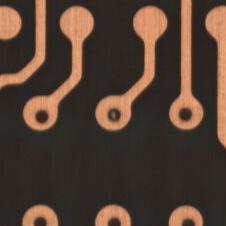

In [ ]:
Image(filename='/content/drive/MyDrive/my_project/0014089.jpg', width=600)

In [ ]:
!ls -l /content/runs/detect/predict2
!ls -l /content/runs/detect/predict3

total 16
-rw-r--r-- 1 root root 15075 Oct 16 05:27 0373057.jpg
total 16
-rw-r--r-- 1 root root 15657 Oct 16 05:28 0377552.jpg


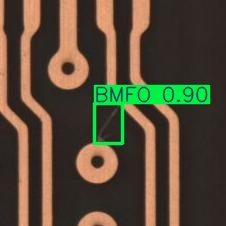

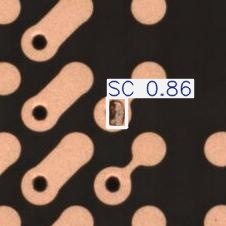

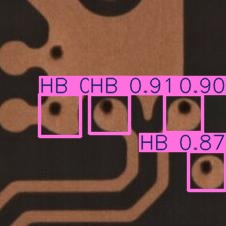

In [ ]:
display(Image(filename='/content/runs/detect/predict2/0373057.jpg', width=600))
display(Image(filename='/content/runs/detect/predict3/0377552.jpg', width=600))
Image(filename='/content/runs/detect/predict/0392539.jpg', width=600)

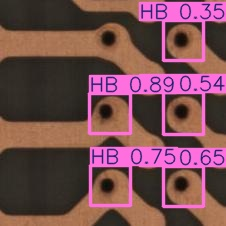

In [ ]:
Image(filename='/content/runs/detect/predict3/0080882.jpg', width=600)

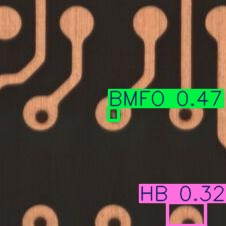

In [ ]:
Image(filename='/content/runs/detect/predict/0014089.jpg', width=600)

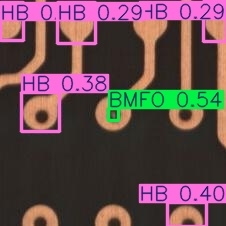

In [ ]:
Image(filename='/content/runs/detect/predict/0014089.jpg', width=600)
Image(filename='/content/runs/detect/predict2/0014089.jpg', width=600)
Image(filename='/content/runs/detect/predict3/0014089.jpg', width=600)

In [ ]:
# detected boxes' coordinates tensors
results[0].boxes.xyxy # [xmin,ymin,xmax,ymax]

tensor([[108.5224, 108.4122, 118.7153, 120.6293],
        [167.1307, 202.3866, 206.3162, 226.0000],
        [ 21.3465,  92.5398,  59.7726, 131.9202],
        [ 57.8074,   2.9212,  95.9634,  43.2542],
        [203.3020,   1.7358, 226.0000,  41.6440],
        [  0.0000,   2.6774,  23.8980,  40.8376]], device='cuda:0')

In [ ]:
# detected boxes' coordinates arrays
results[0].boxes.xyxy.detach().cpu().numpy()

array([[     108.52,      108.41,      118.72,      120.63],
       [     167.13,      202.39,      206.32,         226],
       [     21.347,       92.54,      59.773,      131.92],
       [     57.807,      2.9212,      95.963,      43.254],
       [      203.3,      1.7358,         226,      41.644],
       [          0,      2.6774,      23.898,      40.838]], dtype=float32)

In [ ]:
# confidence values
results[0].boxes.conf.detach().cpu().numpy()
results[0].boxes.conf

tensor([0.5403, 0.4016, 0.3796, 0.2886, 0.2863, 0.2611], device='cuda:0')

In [ ]:
# classes
results[0].boxes.cls.detach().cpu().numpy()
results[0].boxes.cls

tensor([8., 5., 5., 5., 5., 5.], device='cuda:0')

In [ ]:
!pip install opencv-python
import cv2

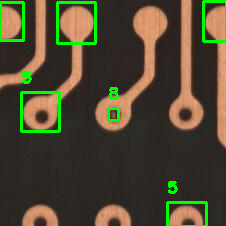

In [ ]:

# 讀取原始圖像
img = cv2.imread('/content/drive/MyDrive/my_project/0014089.jpg')

# 提取預測結果中的邊界框信息
for result in results:
    boxes = result.boxes  # 獲取所有邊界框
    for box in boxes:
        # 提取邊界框的座標（xmin, ymin, xmax, ymax）
        x1, y1, x2, y2 = box.xyxy[0].cpu().int().numpy()
        # 提取類別和置信度
        class_id = int(box.cls[0].cpu().numpy())
        confidence = float(box.conf[0].cpu().numpy())

        # 繪製邊界框到圖像
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        # 標註類別與置信度
        # label = f"Class: {class_id}, Conf: {confidence:.2f}"
        label = f"{class_id}"
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# 保存結果圖像到 Google Drive
cv2.imwrite('/content/drive/MyDrive/my_project/0014089_pred_only_class_id.jpg', img)

# 使用 cv2_imshow 顯示圖像
from google.colab.patches import cv2_imshow  # 導入 cv2_imshow 來顯示圖片
cv2_imshow(img)  # 在 Colab 中顯示圖像的正確方式


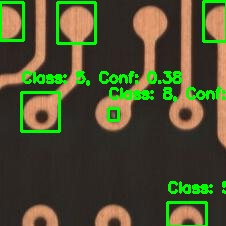

In [ ]:
# Image(filename='/content/drive/MyDrive/my_project/0014089_pred.jpg', width=600)
display(Image(filename='/content/drive/MyDrive/my_project/0014089_pred_only_class_id.jpg', width=600))

In [ ]:
# 6. 導出模型
# 如果需要導出 YOLOv8 模型以便於部署，可以使用以下指令將模型轉換為不同格式（如 ONNX, TensorRT 等）

# 導出模型到不同格式
model.export(format='onnx')  # 可以選擇的格式包括 'torchscript', 'onnx', 'coreml', 'tflite', 'engine'
